In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import argrelextrema
%matplotlib inline

In [28]:
def solar_ac(solar_activity_data_):
    daily_sunspot_numbers = np.loadtxt(solar_activity_data_)
        
    # усреднение по 4 годам

    start_year = 1818
    averaged_data = []
    current_data = []
    save_index = 0
    begin_date =  (1820, 1, 1)
    list_of_solar_activity = []
    i = 0
    cur_sum = 0
    amount_mesaruments = 0
    while(i != 1461):
        current_year = int(daily_sunspot_numbers[i][0])
        current_month = int(daily_sunspot_numbers[i][1])
        current_day = int(daily_sunspot_numbers[i][2])
        cur_date = (current_year, current_month, current_day)
        if current_month == 2 and current_day == 29:
            i += 1
            continue
        solar_activity = daily_sunspot_numbers[i][4]
        current_data.append(solar_activity)
        if solar_activity != -1:
            cur_sum += solar_activity
            amount_mesaruments += 1
        if (cur_date == begin_date):
            save_index = i
        i += 1
    averaged_data.append(cur_sum  / amount_mesaruments)
    list_of_solar_activity.append((begin_date, cur_sum  / amount_mesaruments))
    save_index += 1
    while(i != 73169):
        current_year = int(daily_sunspot_numbers[save_index][0])
        current_month = int(daily_sunspot_numbers[save_index][1])
        current_day = int(daily_sunspot_numbers[save_index][2])
        if current_month == 2 and current_day == 29:
            save_index += 1
            continue
        if int(daily_sunspot_numbers[i][1]) == 2 and int(daily_sunspot_numbers[i][2]) == 29:
            i += 1
            continue
        cur_date = (current_year, current_month, current_day)
        solar_activity = daily_sunspot_numbers[i][4]
        if (current_data[0] != -1) :
            cur_sum -= current_data[0]
            amount_mesaruments -= 1
        current_data.pop(0)
        current_data.append(solar_activity)
        if solar_activity != -1:
            cur_sum += solar_activity
            amount_mesaruments += 1
        averaged_data.append(cur_sum  / amount_mesaruments)
        list_of_solar_activity.append((cur_date, cur_sum  / amount_mesaruments))
        save_index += 1
        i += 1
    
    
    # поиск минимумов 

    local_min_index = []
    intervals_of_search = [(0, 3300), (3300, 6250), (6250, 10200), (10200, 14700),
                           (14700, 18700), (18700, 23100), (23100, 26800), (26800, 31800), (31800, 35800),
                          (35800, 39400), (39400, 43100), (43100, 46700), (46700, 50500), (50500, 54400),
                          (54400, 58500), (58500, 62100), (62100, 66100), (66100, 70700)]
    for interval in intervals_of_search:
        begin = interval[0]
        end = interval[1]
        min_date = 0
        min_activity = 10000
        for i in range(begin, end + 1):
            if (list_of_solar_activity[i][1] <= min_activity):
                min_activity = list_of_solar_activity[i][1]
                min_date = i
        local_min_index.append(min_date)
    
    
    # график солнечной активности 
    
    X = local_min_index
    Y = []
    for i in X:
        Y.append(list_of_solar_activity[i][1])

    plt.figure(figsize=(20,10))
    plt.rc('font', family='serif', size=15)
    plt.title(u'from 1818 to 2018', size = 15)
    plt.text(1, 250, 'graph № 1', size = 30)
    plt.ylabel(u'solar activity', size = 30)
    plt.xlabel(u'day', size = 30)
    plt.grid(True)
    plt.plot(averaged_data, c = "green", linewidth = 2)
    plt.scatter(X, Y)
    plt.legend()

In [1]:
def make_gtrapg(solar_activity_data_, temperature_data_):

    daily_sunspot_numbers = np.loadtxt(solar_activity_data_)
    max_temperatures = np.loadtxt(temperature_data_, delimiter = ',')

    # усреднение по 4 годам

    start_year = 1818
    averaged_data = []
    current_data = []
    save_index = 0
    begin_date =  (1820, 1, 1)
    list_of_solar_activity = []
    i = 0
    cur_sum = 0
    amount_mesaruments = 0
    while(i != 1461):
        current_year = int(daily_sunspot_numbers[i][0])
        current_month = int(daily_sunspot_numbers[i][1])
        current_day = int(daily_sunspot_numbers[i][2])
        cur_date = (current_year, current_month, current_day)
        if current_month == 2 and current_day == 29:
            i += 1
            continue
        solar_activity = daily_sunspot_numbers[i][4]
        current_data.append(solar_activity)
        if solar_activity != -1:
            cur_sum += solar_activity
            amount_mesaruments += 1
        if (cur_date == begin_date):
            save_index = i
        i += 1
    averaged_data.append(cur_sum  / amount_mesaruments)
    list_of_solar_activity.append((begin_date, cur_sum  / amount_mesaruments))
    save_index += 1
    while(i != 73169):
        current_year = int(daily_sunspot_numbers[save_index][0])
        current_month = int(daily_sunspot_numbers[save_index][1])
        current_day = int(daily_sunspot_numbers[save_index][2])
        if current_month == 2 and current_day == 29:
            save_index += 1
            continue
        if int(daily_sunspot_numbers[i][1]) == 2 and int(daily_sunspot_numbers[i][2]) == 29:
            i += 1
            continue
        cur_date = (current_year, current_month, current_day)
        solar_activity = daily_sunspot_numbers[i][4]
        if (current_data[0] != -1) :
            cur_sum -= current_data[0]
            amount_mesaruments -= 1
        current_data.pop(0)
        current_data.append(solar_activity)
        if solar_activity != -1:
            cur_sum += solar_activity
            amount_mesaruments += 1
        averaged_data.append(cur_sum  / amount_mesaruments)
        list_of_solar_activity.append((cur_date, cur_sum  / amount_mesaruments))
        save_index += 1
        i += 1


    # поиск минимумов 

    local_min_index = []
    intervals_of_search = [(0, 3300), (3300, 6250), (6250, 10200), (10200, 14700),
                           (14700, 18700), (18700, 23100), (23100, 26800), (26800, 31800), (31800, 35800),
                          (35800, 39400), (39400, 43100), (43100, 46700), (46700, 50500), (50500, 54400),
                          (54400, 58500), (58500, 62100), (62100, 66100), (66100, 70700)]
    for interval in intervals_of_search:
        begin = interval[0]
        end = interval[1]
        min_date = 0
        min_activity = 10000
        for i in range(begin, end + 1):
            if (list_of_solar_activity[i][1] <= min_activity):
                min_activity = list_of_solar_activity[i][1]
                min_date = i
        local_min_index.append(min_date)
    
    # делаю словарь с разбиением дат на высокую и низкую активность 

    what_activity = {}
    a = 0.5
    begin = 0
    end = 0
    i = 0   
    while i != 18:
        begin = local_min_index[i - 1]
        end = local_min_index[i]
        spots = []
        for j in range(begin, end):
            solar_activity =  list_of_solar_activity[j][1]
            if (solar_activity == -1):
                continue
            date = list_of_solar_activity[j][0]
            spots.append((solar_activity, date))
        spots.sort()
        for j in range(int(len(spots) * 0.5)):
            day = spots[j][1]
            what_activity[day] = 'low'
            day = spots[len(spots) - 1 - j][1]
            what_activity[day] = 'high'
        i += 1
        
    # делаю словарь с разбиением дат на высокую и низкую активность c параметром 0.3
    
    what_activity_with_p = {}
    begin = 0
    end = 0
    i = 0   
    while i != 18:
        begin = local_min_index[i - 1]
        end = local_min_index[i]
        spots = []
        for j in range(begin, end):
            solar_activity =  list_of_solar_activity[j][1]
            if (solar_activity == -1):
                continue
            date = list_of_solar_activity[j][0]
            spots.append((solar_activity, date))
        spots.sort()
        for j in range(int(len(spots) * 0.3)):
            day = spots[j][1]
            what_activity_with_p[day] = 'low'
            day = spots[len(spots) - 1 - j][1]
            what_activity_with_p[day] = 'high'
        i += 1
    
    # обработка температур 

    temperatures_for_high_activity = {}
    temperatures_for_low_activity = {}
    for data in max_temperatures:
        date = str(int(data[0]))
        temperature = int(data[1]) * 0.1
        if int(data[1]) == -9999:
            continue
        year = int(date[:4])
        month = int(date[4:6])
        day = int(date[6:])
        date = (year, month, day)
        if month == 2 and day == 29:
            continue
        if date in what_activity and what_activity[date] == 'high':
            if not (month, day) in temperatures_for_high_activity:
                temperatures_for_high_activity[(month, day)] = []
                temperatures_for_high_activity[(month, day)].append(temperature)
            else:
                temperatures_for_high_activity[(month, day)].append(temperature)
        elif date in what_activity and what_activity[date] == 'low':
            if not (month, day) in temperatures_for_low_activity:
                temperatures_for_low_activity[(month, day)] = []
                temperatures_for_low_activity[(month, day)].append(temperature)
            else:
                temperatures_for_low_activity[(month, day)].append(temperature) 
                
                
    
    
    # обработка температур с параметром 0.3

    temperatures_for_high_activity_with_p = {}
    temperatures_for_low_activity_with_p = {}
    for data in max_temperatures:
        date = str(int(data[0]))
        temperature = int(data[1]) * 0.1
        if int(data[1]) == -9999:
            continue
        year = int(date[:4])
        month = int(date[4:6])
        day = int(date[6:])
        date = (year, month, day)
        if month == 2 and day == 29:
            continue
        if date in what_activity_with_p and what_activity_with_p[date] == 'high':
            if not (month, day) in temperatures_for_high_activity_with_p:
                temperatures_for_high_activity_with_p[(month, day)] = []
                temperatures_for_high_activity_with_p[(month, day)].append(temperature)
            else:
                temperatures_for_high_activity_with_p[(month, day)].append(temperature)
        elif date in what_activity_with_p and what_activity_with_p[date] == 'low':
            if not (month, day) in temperatures_for_low_activity_with_p:
                temperatures_for_low_activity_with_p[(month, day)] = []
                temperatures_for_low_activity_with_p[(month, day)].append(temperature)
            else:
                temperatures_for_low_activity_with_p[(month, day)].append(temperature) 
    
    
            
    # средние температуры для каждого дня в году

    average_temperatures_for_high_activity = []
    standard_deviation_for_high_activity = []
    count_days_for_high = []
    count_days_for_low = []
    for date in sorted(temperatures_for_high_activity.keys()):
        average_t =  np.mean(temperatures_for_high_activity[date])
        x = temperatures_for_high_activity[date]
        l = len(x) - 1
        count_days_for_high.append(l + 1)
        standard_deviation = (sum((x - average_t)**2) / l) ** (1/2)
        average_temperatures_for_high_activity.append(average_t)
        standard_deviation_for_high_activity.append(standard_deviation)
    average_temperatures_for_low_activity = []
    standard_deviation_for_low_activity = []
    for date in sorted(temperatures_for_low_activity.keys()):
        average_t =  np.mean(temperatures_for_low_activity[date])
        x = temperatures_for_low_activity[date]
        l = len(x) - 1
        count_days_for_low.append(l + 1)
        standard_deviation = (sum((x - average_t)**2) / l) ** (1/2)
        average_temperatures_for_low_activity.append(average_t)
        standard_deviation_for_low_activity.append(standard_deviation)
        
        standart_div = (standard_deviation_for_high_activity + standard_deviation_for_low_activity)
        
    # средние температуры для каждого дня в году c параметром 0.3
    
    average_temperatures_for_high_activity_with_p = []
    standard_deviation_for_high_activity_with_p = []
    for date in sorted(temperatures_for_high_activity_with_p.keys()):
        average_t =  np.mean(temperatures_for_high_activity_with_p[date])
        x = temperatures_for_high_activity_with_p[date]
        l = len(x) - 1
        standard_deviation = (sum((x - average_t)**2) / l) ** (1/2)
        average_temperatures_for_high_activity_with_p.append(average_t)
        standard_deviation_for_high_activity_with_p.append(standard_deviation)
    average_temperatures_for_low_activity_with_p = []
    standard_deviation_for_low_activity_with_p = []
    for date in sorted(temperatures_for_low_activity_with_p.keys()):
        average_t =  np.mean(temperatures_for_low_activity_with_p[date])
        x = temperatures_for_low_activity_with_p[date]
        l = len(x) - 1
        standard_deviation = (sum((x - average_t)**2) / l) ** (1/2)
        average_temperatures_for_low_activity_with_p.append(average_t)
        standard_deviation_for_low_activity_with_p.append(standard_deviation)
    
        standart_div_with_p = (standard_deviation_for_high_activity_with_p 
                               + standard_deviation_for_low_activity_with_p)
    
    
    # график температур для высокой и низкой

    graph_first = []
    g_s = []
    i = 0
    while i != 365:
        graph_first.append(average_temperatures_for_high_activity[i])
        g_s.append(average_temperatures_for_low_activity[i])
        i += 1
    plt.rc('font', family='serif', size=100) 
    plt.figure(figsize=(150,40))
    plt.title(temperature_data_, size = 100)
    plt.plot(graph_first, c = "red", linewidth = 3, )
    plt.plot(g_s, c = "blue", linewidth = 3, )
    plt.plot([0] * 365, c = 'black')
    plt.legend()

    # график разности 
    mean_diff = 0
    median_diff = 0
    median_diff_with_p = 0
    graph_diff = []
    graph_diff_with_p = []
    i = 0
    while i != 365:
        graph_diff.append(average_temperatures_for_high_activity[i] - 
                          average_temperatures_for_low_activity[i])
        graph_diff_with_p.append(average_temperatures_for_high_activity_with_p[i] - 
                          average_temperatures_for_low_activity_with_p[i])
        mean_diff += (average_temperatures_for_high_activity[i] - average_temperatures_for_low_activity[i])
        i += 1
        
    median_diff = np.median(graph_diff)
    median_diff_with_p = np.median(graph_diff_with_p)
        
    plt.rc('font', family='serif', size=100) 
    plt.figure(figsize=(150,40))
    plt.title(temperature_data_, size = 100)
    plt.grid(True)
    plt.plot(graph_diff, c = "blue", linewidth = 3, 
             label = u'разность средних температур без параметра')
    #plt.plot(graph_diff_with_p, c = "red", linewidth = 3, 
             #label = u'разность средних температур с параметром = 0.3')
    #plt.plot(standart_div, c = 'black', linewidth = 2, label = u'стандартное отклонение')
    plt.plot([0] * 365, c = 'black')
    plt.legend()
    
    
    # разность усредненная за 21 день
    
    graph_f = []
    i = 0
    while i != 365:
        j = 1
        average_t_h_without_p = 0
        average_t_l_without_p = 0
        average_t_h_without_p += average_temperatures_for_high_activity[i]
        average_t_l_without_p += average_temperatures_for_low_activity[i]
        while (j <= 10):
            index_plus = i + j
            index_minus = i - j
            if index_plus >= 365:
                index_plus -= 365
            if index_minus < 0:
                index_minus += 365
            average_t_h_without_p += average_temperatures_for_high_activity[index_plus]
            average_t_h_without_p += average_temperatures_for_high_activity[index_minus]
            average_t_l_without_p += average_temperatures_for_low_activity[index_plus]
            average_t_l_without_p += average_temperatures_for_low_activity[index_minus]
            j += 1
        graph_f.append((average_t_h_without_p - average_t_l_without_p) / 21)
        i += 1
    
    
    graph_f_with_p = []
    i = 0
    while i != 365:
        j = 1
        average_t_h_with_p = 0
        average_t_l_with_p = 0
        average_t_h_with_p += average_temperatures_for_high_activity_with_p[i]
        average_t_l_with_p += average_temperatures_for_low_activity_with_p[i]
        while (j <= 10):
            index_plus = i + j
            index_minus = i - j
            if index_plus >= 365:
                index_plus -= 365
            if index_minus < 0:
                index_minus += 365
            average_t_h_with_p += average_temperatures_for_high_activity_with_p[index_plus]
            average_t_h_with_p += average_temperatures_for_high_activity_with_p[index_minus]
            average_t_l_with_p += average_temperatures_for_low_activity_with_p[index_plus]
            average_t_l_with_p += average_temperatures_for_low_activity_with_p[index_minus]
            j += 1
        graph_f_with_p.append((average_t_h_with_p - average_t_l_with_p) / 21)
        i += 1
        
        
        
    
    plt.rc('font', family='serif', size=100) 
    plt.figure(figsize=(150,40))
    plt.title(temperature_data_, size = 100)
    plt.text(1, 1.1, 'graph № 9"', size = 150)
    plt.grid(True)
    plt.plot(graph_f, c = "blue", linewidth = 2, 
             label = u'разность средних температур без параметра')
    #plt.plot(graph_f_with_p, c = "red", linewidth = 2, 
            # label = u'разность средних температур с параметром = 0.3')
    plt.plot([0] * 365, c = 'black')
    plt.legend()
    
    
    
    # среднее разностей + медианы
    print("среднее разностей = ",mean_diff / 365)
    print("медиана разностей без параметра = ", median_diff)
    print("медиана разностей с параметром 0.3 = ", median_diff_with_p)

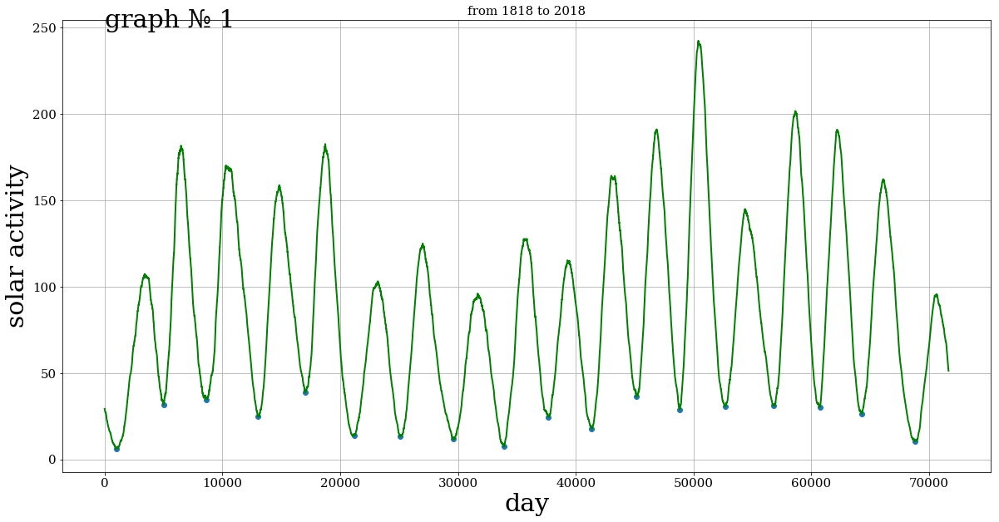

In [42]:
solar_ac("daily_sunspot_numbers.txt")

среднее разностей =  0.104999687204
медиана разностей без параметра =  0.0851612903226
медиана разностей с параметром 0.3 =  0.0718390804598


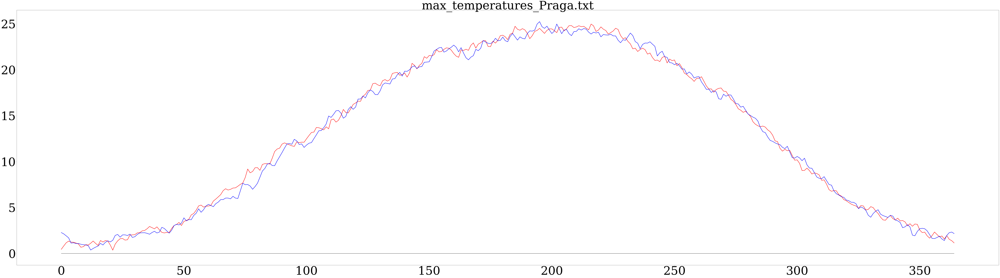

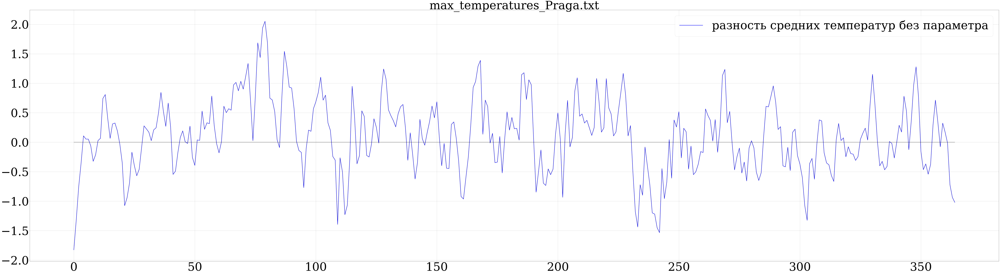

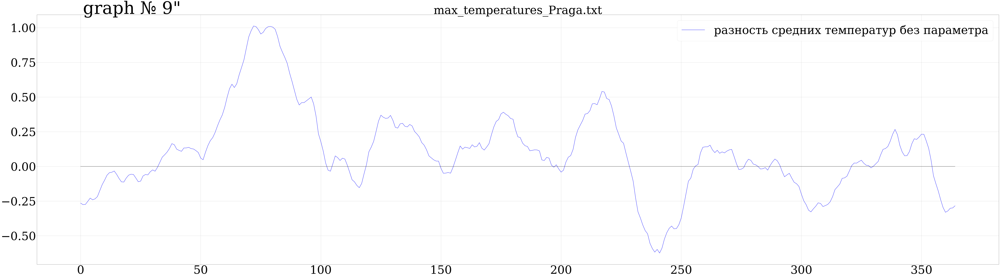

In [3]:
make_gtrapg("daily_sunspot_numbers.txt", "max_temperatures_Praga.txt")

среднее разностей =  0.043152946195
медиана разностей без параметра =  0.0433816425121
медиана разностей с параметром 0.3 =  -0.0430199430199


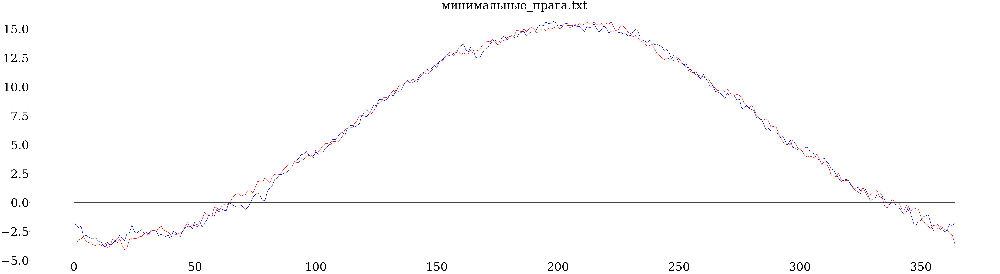

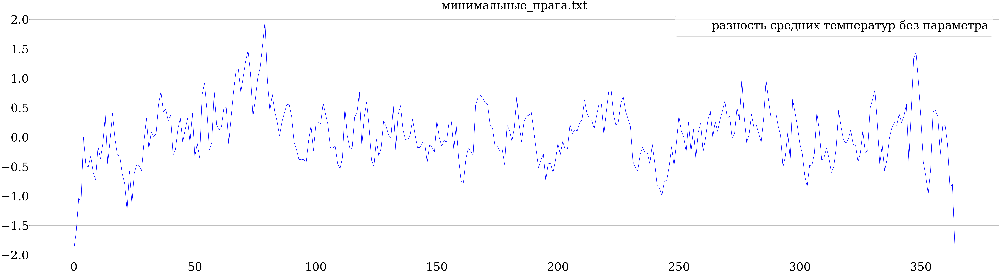

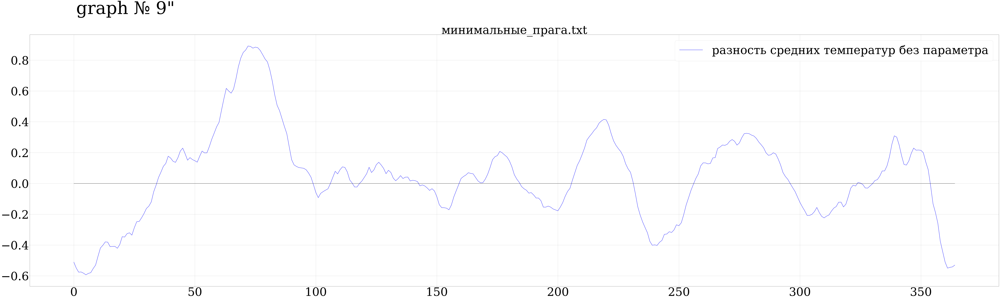

In [4]:
make_gtrapg("daily_sunspot_numbers.txt", "минимальные_прага.txt")

среднее разностей =  -0.0113409065749
медиана разностей без параметра =  -0.0198380566802
медиана разностей с параметром 0.3 =  -0.137643097643


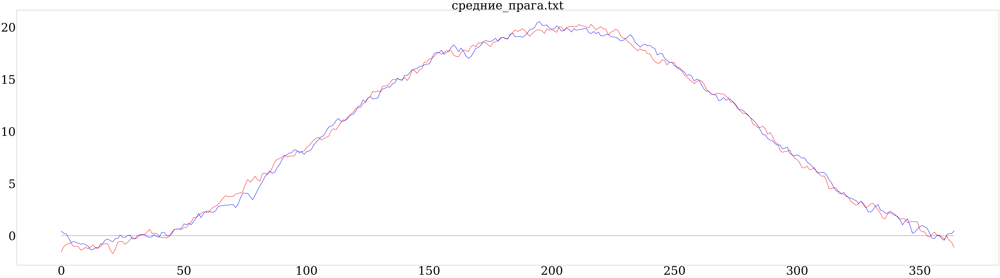

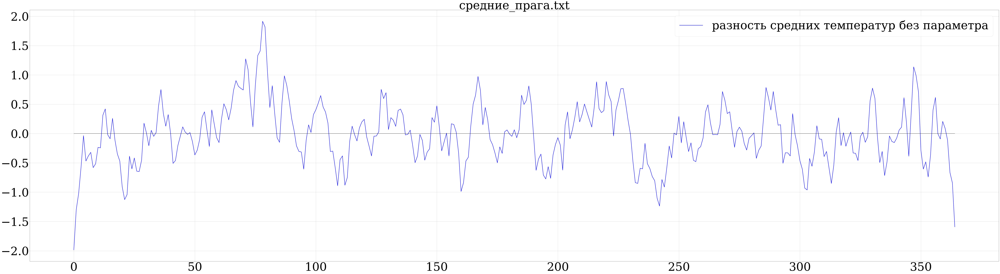

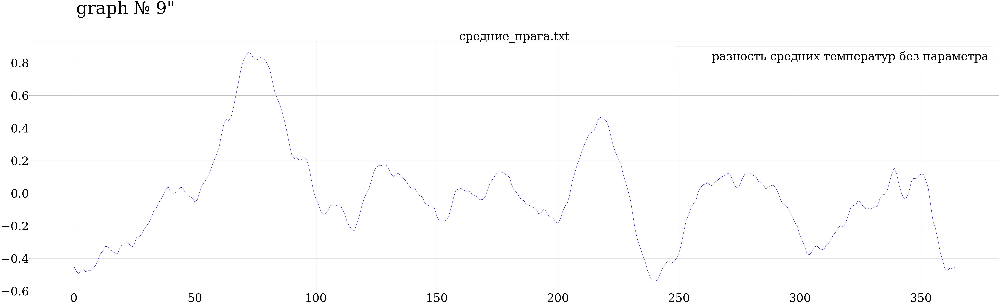

In [5]:
make_gtrapg("daily_sunspot_numbers.txt", "средние_прага.txt")

среднее разностей =  -0.0301690644141
медиана разностей без параметра =  -0.0158602150538
медиана разностей с параметром 0.3 =  -0.0521548821549


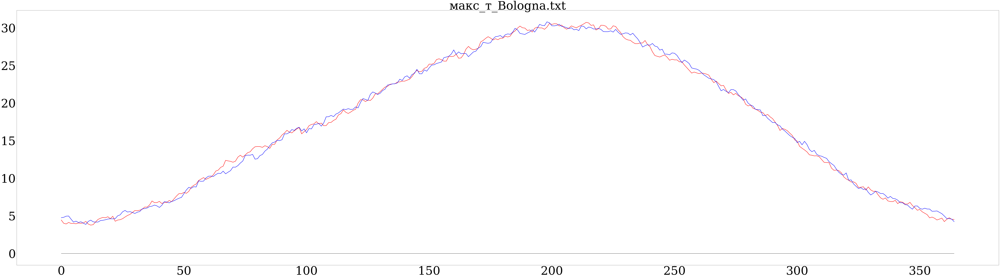

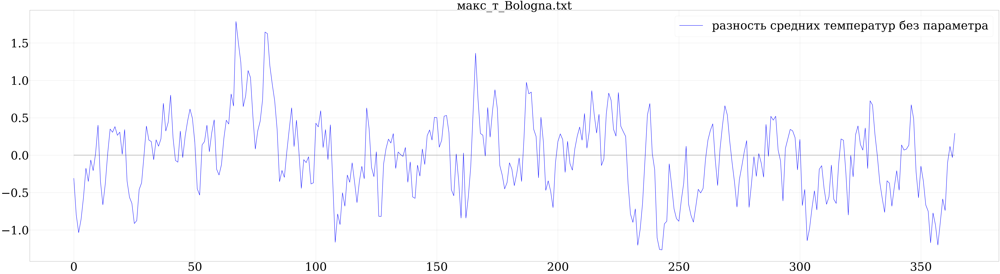

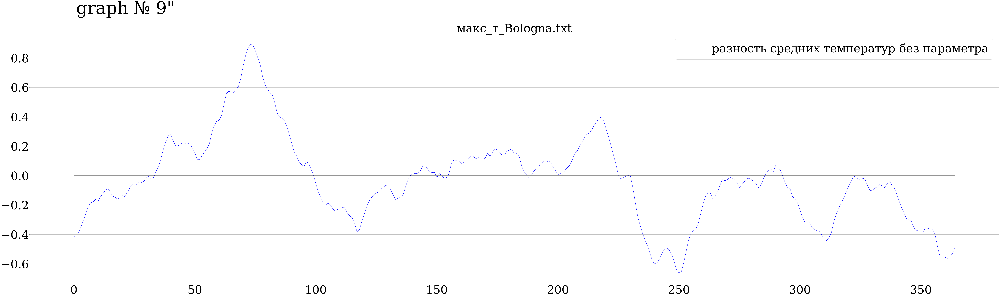

In [6]:
make_gtrapg("daily_sunspot_numbers.txt", "макс_т_Bologna.txt")

среднее разностей =  0.171714787628
медиана разностей без параметра =  0.166292134831
медиана разностей с параметром 0.3 =  0.0909544159544


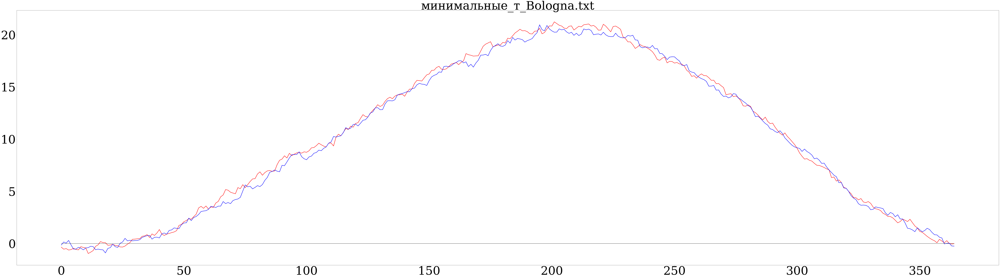

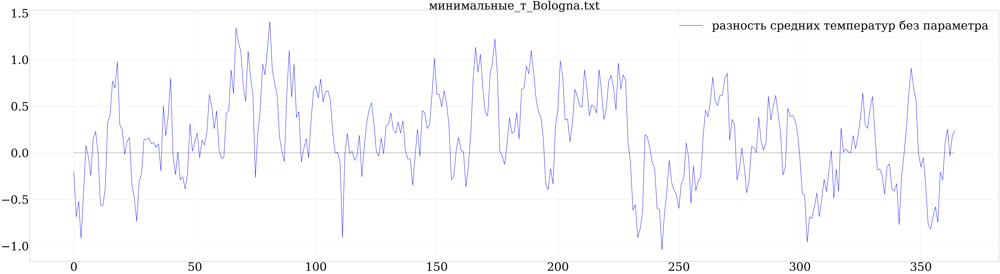

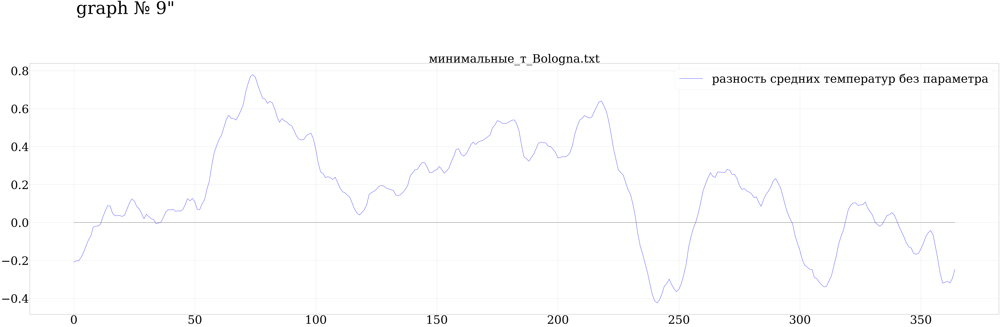

In [7]:
make_gtrapg("daily_sunspot_numbers.txt", "минимальные_т_Bologna.txt")

среднее разностей =  0.0707268372089
медиана разностей без параметра =  0.0686736687836
медиана разностей с параметром 0.3 =  -0.0231469002695


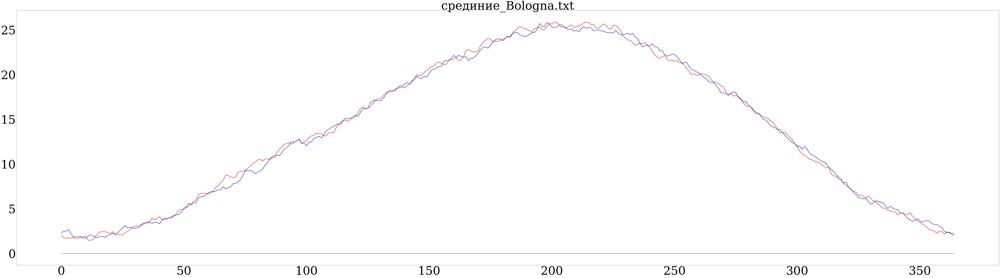

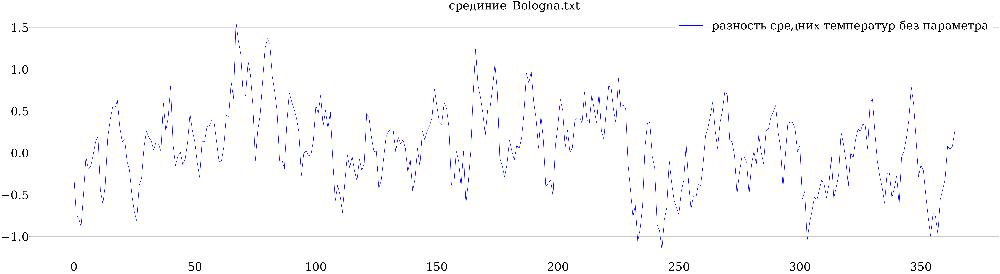

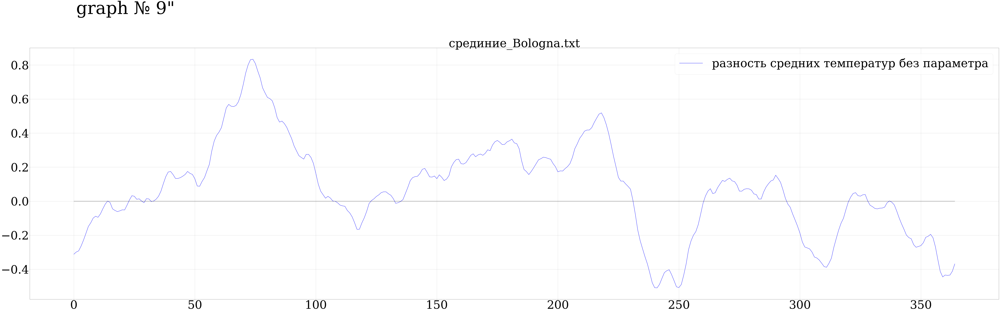

In [8]:
make_gtrapg("daily_sunspot_numbers.txt", "срединие_Bologna.txt")

среднее разностей =  0.0296139847016
медиана разностей без параметра =  0.0562790697674
медиана разностей с параметром 0.3 =  0.10995190529


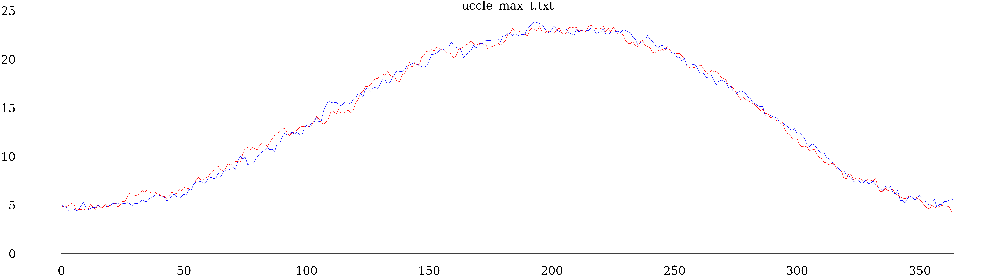

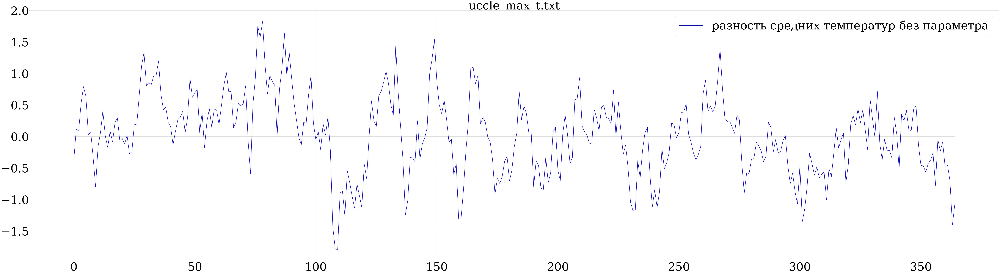

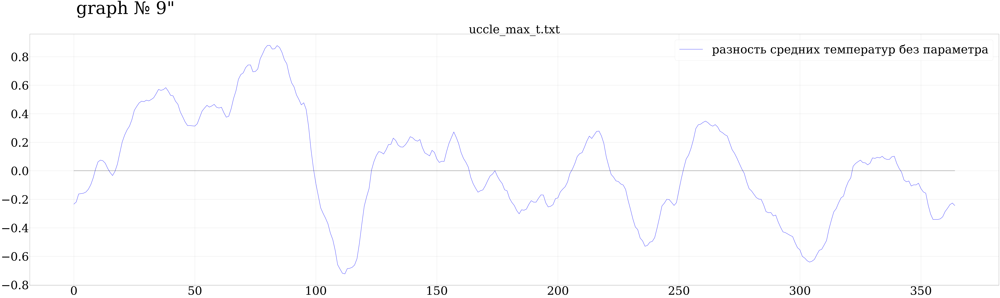

In [9]:
make_gtrapg("daily_sunspot_numbers.txt", "uccle_max_t.txt")

среднее разностей =  0.0167832849167
медиана разностей без параметра =  0.0358686730506
медиана разностей с параметром 0.3 =  0.0643057222889


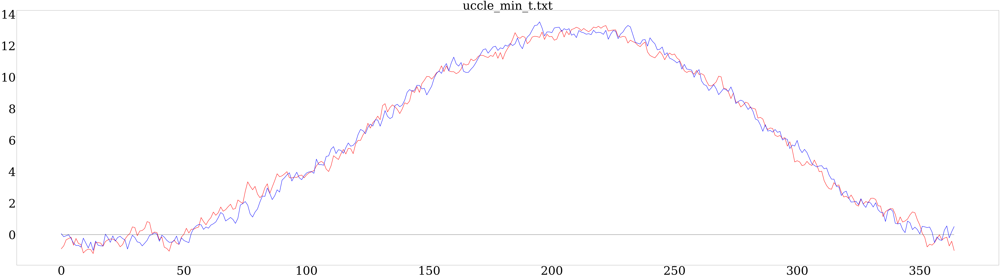

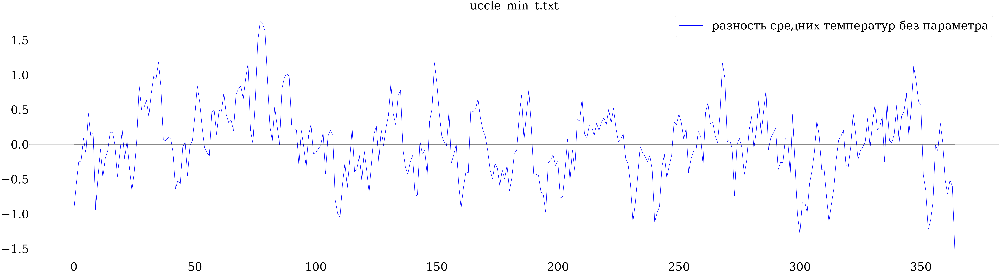

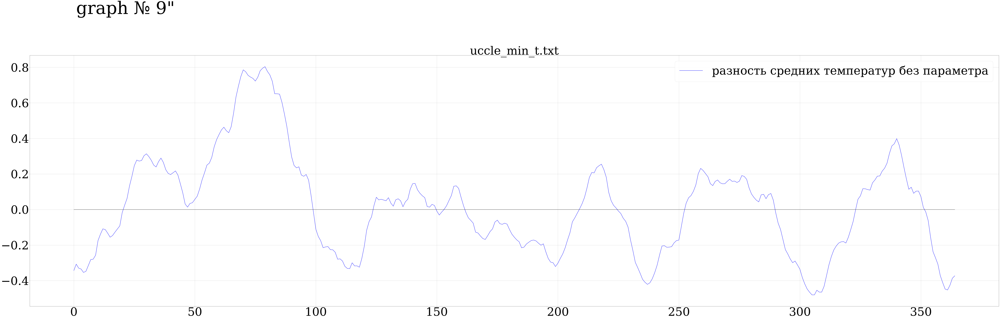

In [10]:
make_gtrapg("daily_sunspot_numbers.txt", "uccle_min_t.txt")